In [1]:
using Revise

In [2]:
using
    QuantumStates,
    OpticalBlochEquations,
    DifferentialEquations,
    UnitsToValue,
    LinearAlgebra,
    Printf,
    Plots,
    Random,
    StatsBase
;

import MutableNamedTuples: MutableNamedTuple
import StructArrays: StructArray, StructVector
import StaticArrays: @SVector, SVector
import LinearAlgebra: norm, ⋅, adjoint!, diag
import LoopVectorization: @turbo
using BenchmarkTools
using Parameters
using LsqFit

import ProgressMeter: Progress, next!

const λ = 606e-9
const Γ = 2π* 8.3e6
const m = @with_unit 59 "u"
const k = 2π / λ
_μB = (μ_B / h) * 1e-4;

[ Info: Precompiling OpticalBlochEquations [691d0331-80d3-41b1-b293-7891a6f4a14f]


In [3]:
function Gaussian(x, p)
    σ, x0, A = p
   return A * exp.(-(x.-x0).^2/(2*σ^2)) 
end;

### Stochastic SE for time-dependent Hamiltonians

In [4]:
function SE_collapse_pol!(integrator)
    """ 
    The previous method collapses both the excited state and the polarization of the emitted photon.
    But in reality, we should collapse something iff the information is leaked into the environment, which, in our case
    does NOT include the identity of the excited state, no matter what you choose to measure.
    
    The current approach assumes the environment measures the polarization of the photon along z. We do not collapse which 
    excited state the molecule is in, therefore preserving some coherence (the state after collapse can be a superposition
    of different ground states).
    
    And because phase information between excited states is preserved during collapse, we can not sample based on average 
    excited state population anymore.
    
    See Dalibard, Castin & Molmer PRL 1992
    """ 
    n_states = length(integrator.p.states)
    n_excited = integrator.p.extra_p.n_excited
    n_ground = n_states - n_excited
    dT = integrator.p.extra_p.dT
    d = integrator.p.d
    ψ = integrator.u
    
    # save_every = 10000, save_counter = 0, trajectory = []
    extra_p = integrator.p.extra_p
    extra_p.save_counter += 1
    if extra_p.save_counter >= extra_p.save_every
       push!(extra_p.trajectory, deepcopy(integrator.u))
        extra_p.save_counter = 0
    end
    
    p_decay = 0
    for i in 1:n_excited
        p_decay += norm(ψ[n_ground + i])^2 * dT
    end
    
    rn = rand()
    if rn > p_decay
        # No photon is observed. Coherent population by H_eff.
        return nothing
    end
    
    # A photon is observed.
    # Measure the polarization of the photon along z.
    p⁺ = 0
    p⁰ = 0
    p⁻ = 0
    
    for i in 1:n_excited
        # p⁺ += norm(ψ[n_states + i])^2 * sum(norm.(d[:,i,1]).^2)
        # p⁰ += norm(ψ[n_states + i])^2 * sum(norm.(d[:,i,2]).^2)
        # p⁻ += norm(ψ[n_states + i])^2 * sum(norm.(d[:,i,3]).^2)
        p⁺ += norm(ψ[n_ground + i])^2 * sum(norm.(d[:,n_ground+i,1]).^2)
        p⁰ += norm(ψ[n_ground + i])^2 * sum(norm.(d[:,n_ground+i,2]).^2)
        p⁻ += norm(ψ[n_ground + i])^2 * sum(norm.(d[:,n_ground+i,3]).^2)
        
        # note the polarization p in d[:,:,p] is defined to be m_e - m_g, 
        # whereas the polarization of the emitted photon is m_g - m_e
    end
    
    p_norm = p⁺ + p⁰ + p⁻
    rn = rand() * p_norm
    ψ[1:n_ground] .= 0 # zero ground state amplitudes
    
    pol = 0
    if 0 < rn <= p⁺ # photon is measured to have polarization σ⁺
        pol = 1
    elseif p⁺ < rn <= p⁺ + p⁰ # photon is measured to have polarization σ⁰
        pol = 2
    else # photon is measured to have polarization σ⁻
        pol = 3
    end
    
    for i in 1:n_ground
        for j in (n_ground+1):n_states
            ψ[i] += ψ[j] * d[i,j,pol]
        end
    end
    # ψ[n_ground + 1:n_states] .= 0
    ψ[(n_ground + 1):n_states] .= 0 # zero excited state amplitudes
    ψ[(n_states + 1):n_excited] .= 0 # zero excited state populations
    
    ψ_norm = 0.0
    for i ∈ 1:n_states
        ψ_norm += norm(ψ[i])^2
    end
    ψ_norm = sqrt(ψ_norm)
    for i ∈ 1:n_states
        ψ[i] /= ψ_norm
    end
    
    integrator.p.n_scatters += 1
    
     # reset excited state population accumulation
#     integrator.u[n_states + 1: n_states + n_excited] .= 0
    
#     for i in 1:n_states
#         integrator.p.populations[i] = norm(integrator.u[i])^2
#     end
    
    dp = sample_direction(1)
    dv = dp ./ integrator.p.mass
    integrator.u[n_states + n_excited + 4] += dv[1]
    integrator.u[n_states + n_excited + 5] += dv[2]
    integrator.u[n_states + n_excited + 6] += dv[3]
    

    
end
 
function spontaneous_emission_event(p, i_excited)
    """ 
        Excited state i_excited sponatneously emits. Randomly sample which ground state it decays into, 
        return the ground state index and change in m_F (which is relevant in determining the direction of
        momentum kick).
        
    """
    n_states = length(p.states)
    
    transition_probs = norm.(p.d[:,i_excited,:]).^2
    w = weights(transition_probs)
    i = sample(w)
    δm = -((i-1)÷n_states - 2)
    i_ground = (i-1) % n_states + 1
    # @printf("decay from %i to %i", i_excited, i_ground)
    # println()

    return (i_ground, δm)
end;

using Distributions
uniform_dist = Uniform(0, 2π)
function sample_direction(r=1.0)
    θ = 2π * rand()
    z = rand() * 2 - 1
    return (r * sqrt(1 - z^2) * cos(θ), r * sqrt(1 - z^2) * sin(θ), r * z)
end
;

In [230]:
H_operator = :(
    T * L
)
parameters = @params begin
    T = 478e12
end

# Create basis states
QN_bounds = (L = 0, N = 0)
ground_states = enumerate_states(AngularMomentumState_Labelled, QN_bounds)
QN_bounds = (L = 1, N = 1)
excited_states = enumerate_states(AngularMomentumState_Labelled, QN_bounds)

# Create Hamiltonian
basis = [ground_states; excited_states]
H = Hamiltonian(basis=basis, operator=H_operator, parameters=parameters)

evaluate!(H)
QuantumStates.solve!(H)

# Add Zeeman terms
Zeeman_x(state, state′) = (Zeeman_L1(state, state′,-1) - Zeeman_L1(state, state′,1))/sqrt(2)
Zeeman_y(state, state′) = im*(Zeeman_L1(state, state′,-1) + Zeeman_L1(state, state′,1))/sqrt(2)
Zeeman_z(state, state′) = Zeeman_L1(state, state′, 0)

H = add_to_H(H, :B_x, (gS*_μB) .* Zeeman_x)
H = add_to_H(H, :B_y, (gS*_μB) .* Zeeman_y)
H = add_to_H(H, :B_z, (gS*_μB) .* Zeeman_z)

H.parameters.B_x = 0.0
H.parameters.B_y = 0.0
H.parameters.B_z = 0.0
evaluate!(H)
QuantumStates.solve!(H)

ω = 2π * (energy(H.states[end]) - energy(H.states[1]))

H.parameters.B_x = 0.01
H.parameters.B_y = 0.0
H.parameters.B_z = 0.0
evaluate!(H)
QuantumStates.solve!(H)
states = H.states

update_basis_tdms!(H)
update_tdms!(H)
d = H.tdms
d_copy = deepcopy(d)
for j in 1:1:length(H.states)
   d[:, j, :] =  d[:, j, :]
end
;

In [239]:
function update_H(H, p, r, τ)
    Zeeman_Hx = p.extra_p.Zeeman_Hx
    Zeeman_Hy = p.extra_p.Zeeman_Hy
    Zeeman_Hz = p.extra_p.Zeeman_Hz
    gradient_z = p.extra_p.gradient_z
    gradient_x = p.extra_p.gradient_x
    gradient_y = p.extra_p.gradient_y
    @turbo for i in eachindex(H)
        H.re[i] = gradient_x * Zeeman_Hx.re[i] + gradient_y * Zeeman_Hy.re[i]  + gradient_z * Zeeman_Hz.re[i] 
        H.im[i] = gradient_x * Zeeman_Hx.im[i]  + gradient_y * Zeeman_Hy.im[i]  + gradient_z * Zeeman_Hz.im[i] 
    
        # H.re[i] = gradient_x * Zeeman_Hx.re[i] * r[1] + gradient_y * Zeeman_Hy.re[i] * r[2] + gradient_z * Zeeman_Hz.re[i] * r[3]
        # H.im[i] = gradient_x * Zeeman_Hx.im[i] * r[1] + gradient_y * Zeeman_Hy.im[i] * r[2] + gradient_z * Zeeman_Hz.im[i] * r[3]
    end
    return nothing
end

function randomize_initial_vector!(p, r_dist, v_dist)
    n_excited = extra_p.n_excited
    n_states = length(p.states)
    p.ψ[n_states + n_excited + 1] = rand(r_dist)*k
    p.ψ[n_states + n_excited + 2] = rand(r_dist)*k
    p.ψ[n_states + n_excited + 3] = rand(r_dist)*k
    p.ψ[n_states + n_excited + 4] = rand(v_dist)*k/Γ
    p.ψ[n_states + n_excited + 5] = rand(v_dist)*k/Γ
    p.ψ[n_states + n_excited + 6] = rand(v_dist)*k/Γ
end
;

In [240]:
import QuantumStates.extend_operator
function extend_operator(operator::T, state::State, state′::State, args...) where {T}
    val = zero(ComplexF64)
    for (i, basis_state) in enumerate(state.basis)
        for (j, basis_state′) in enumerate(state′.basis)
            val += conj(state.coeffs[i]) * state′.coeffs[j] * operator(basis_state, basis_state′, args...)
            # coeff1 = state.coeffs[i]
            # coeff2 = state′.coeffs[i]
            # if (norm(coeff1)^2 > 1e-5) && (norm(coeff1)^2 > 1e-5)
                # val += state.coeffs[i] * state′.coeffs[j] * operator(basis_state, basis_state′, args...)
            # end
        end
    end
    return val
end
# extend_operator1(Zeeman_y,states[2], states[2])

extend_operator (generic function with 1 method)

In [241]:
function operator_to_matrix(A, states)
    """
    Write an operator as a matrix in basis {states}.
    """
    n_states = length(states)
    A_mat = zeros(ComplexF64, n_states, n_states)
    for i in 1:n_states
        for j in 1:n_states
            A_mat[i,j] = extend_operator(A, states[i], states[j])
        end
    end
    return A_mat
end
 #TODO: mult 2pi
Zeeman_x_mat = StructArray(operator_to_matrix(Zeeman_x, H.states)*(gS*_μB)./ Γ .*(2π))
Zeeman_y_mat = StructArray(operator_to_matrix(Zeeman_y, H.states)*(gS*_μB)./ Γ .*(2π))
Zeeman_z_mat = StructArray(operator_to_matrix(Zeeman_z, H.states)*(gS*_μB)./ Γ .*(2π))
;

In [242]:
display.(H.states)

State{AngularMomentumState_Labelled}(0.0, AngularMomentumState_Labelled[AngularMomentumState_Labelled(0.0, 0, 0, 0, (M = 0:0,)), AngularMomentumState_Labelled(0.0, 1, 1, -1, (M = -1:1,)), AngularMomentumState_Labelled(0.0, 1, 1, 0, (M = -1:1,)), AngularMomentumState_Labelled(0.0, 1, 1, 1, (M = -1:1,))], ComplexF64[1.0 + 0.0im, 0.0 + 0.0im, 0.0 + 0.0im, 0.0 + 0.0im], 1)

State{AngularMomentumState_Labelled}(4.7799999997197506e14, AngularMomentumState_Labelled[AngularMomentumState_Labelled(0.0, 0, 0, 0, (M = 0:0,)), AngularMomentumState_Labelled(0.0, 1, 1, -1, (M = -1:1,)), AngularMomentumState_Labelled(0.0, 1, 1, 0, (M = -1:1,)), AngularMomentumState_Labelled(0.0, 1, 1, 1, (M = -1:1,))], ComplexF64[0.0 + 0.0im, -0.5000000000000007 - 0.0im, 0.7071067811865477 + 0.0im, -0.4999999999999991 - 0.0im], 2)

State{AngularMomentumState_Labelled}(4.78e14, AngularMomentumState_Labelled[AngularMomentumState_Labelled(0.0, 0, 0, 0, (M = 0:0,)), AngularMomentumState_Labelled(0.0, 1, 1, -1, (M = -1:1,)), AngularMomentumState_Labelled(0.0, 1, 1, 0, (M = -1:1,)), AngularMomentumState_Labelled(0.0, 1, 1, 1, (M = -1:1,))], ComplexF64[0.0 + 0.0im, 0.7071067811865467 + 0.0im, 5.841546122306697e-16 - 0.0im, -0.7071067811865485 - 0.0im], 3)

State{AngularMomentumState_Labelled}(4.7800000002802494e14, AngularMomentumState_Labelled[AngularMomentumState_Labelled(0.0, 0, 0, 0, (M = 0:0,)), AngularMomentumState_Labelled(0.0, 1, 1, -1, (M = -1:1,)), AngularMomentumState_Labelled(0.0, 1, 1, 0, (M = -1:1,)), AngularMomentumState_Labelled(0.0, 1, 1, 1, (M = -1:1,))], ComplexF64[0.0 + 0.0im, 0.5000000000000002 - 0.0im, 0.7071067811865477 + 0.0im, 0.49999999999999967 - 0.0im], 4)

4-element Vector{Nothing}:
 nothing
 nothing
 nothing
 nothing

In [243]:
k̂ = +ẑ; ϵ5 = rotate_pol(σ⁺, k̂)

3-element SVector{3, ComplexF64} with indices SOneTo(3):
 0.0 + 0.0im
 0.0 + 0.0im
 1.0 + 0.0im

In [244]:
s = 5.
Δ = gS*_μB * 100 *2π

# ϵ_(ϵ, f) = t -> exp(-im*2π*f*t/5000) .* ϵ
ϵ_(ϵ, f) = t -> ϵ

k̂ = +x̂; ϵ1 = rotate_pol(σ⁺, k̂); ϵ_func1 = ϵ_(ϵ1, 0.0); laser1 = Field(k̂, ϵ_func1, ω + Δ, s)
k̂ = -x̂; ϵ2 = rotate_pol(σ⁺, k̂); ϵ_func2 = ϵ_(ϵ2, 0.0); laser2 = Field(k̂, ϵ_func2, ω + Δ, s)
k̂ = +ŷ; ϵ3 = rotate_pol(σ⁺, k̂); ϵ_func3 = ϵ_(ϵ3, 0.0); laser3 = Field(k̂, ϵ_func3, ω + Δ, s)
k̂ = -ŷ; ϵ4 = rotate_pol(σ⁺, k̂); ϵ_func4 = ϵ_(ϵ4, 0.0); laser4 = Field(k̂, ϵ_func4, ω + Δ, s)
k̂ = +ẑ; ϵ5 = rotate_pol(σ⁺, k̂); ϵ_func5 = ϵ_(ϵ5, 0.0); laser5 = Field(k̂, ϵ_func5, ω + Δ, s)
k̂ = -ẑ; ϵ6 = rotate_pol(σ⁻, k̂); ϵ_func6 = ϵ_(ϵ6, 0.0); laser6 = Field(k̂, ϵ_func6, ω + Δ, s)

# lasers = [laser1, laser2, laser3, laser4, laser5, laser6]

# lasers = [laser1, laser2]
# lasers = [laser3, laser4]
lasers = [laser1]#, laser6]
;

In [249]:
particle = OpticalBlochEquations.Particle()
particle.r = (0,0,0) ./ (1e3/k) # initial position in mm
particle.v = (0.,0.,0.) ./ (Γ/k)
ψ₀ = zeros(ComplexF64, length(states))
ψ₀[1] = 1.0
H₀ = zeros(ComplexF64, length(states), length(states))
n_states = length(states)

dT = 0.1
save_every = 1000
extra_p = MutableNamedTuple(n_excited=length(excited_states), Zeeman_Hz=Zeeman_z_mat, Zeeman_Hx = Zeeman_x_mat, Zeeman_Hy = Zeeman_y_mat,
                            gradient_z=0.0, gradient_x=100.0, gradient_y=0.0, dT=dT, save_every=save_every, save_counter=0, trajectory=Vector{ComplexF64}[])

p = schrodinger_stochastic(particle, states, lasers, d, ψ₀, m/(ħ*k^2/Γ);
    extra_p=extra_p, λ=λ, Γ=Γ, update_H=update_H)

t_span = (0,10)
# cb = PeriodicCallback(SE_collapse_pol!, dT, save_positions=(true,true))
do_nothing(integrator) = nothing; cb = PeriodicCallback(do_nothing, dT, save_positions=(true,true))

prob = ODEProblem(ψ_stochastic!, p.ψ, t_span, p)
@time sol = DifferentialEquations.solve(prob, alg=DP5(), reltol=1e-5, maxiters=80000000, callback=cb);#, save_on=false);

  0.279801 seconds (290.15 k allocations: 21.149 MiB, 97.95% compilation time: 100% of which was recompilation)


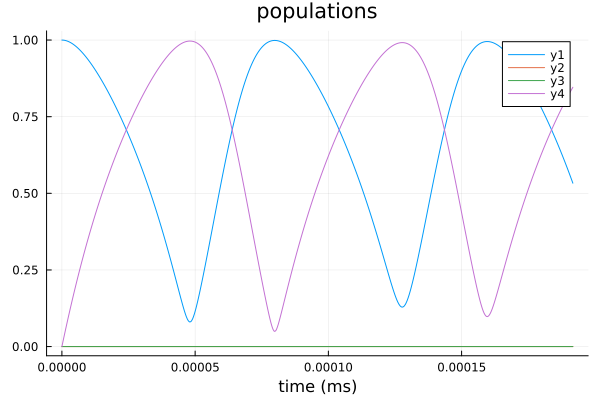

In [250]:
plot_us = sol.u[1:1:end]
plot_ts = sol.t[1:1:end]

plot()
for i in 1:n_states
    plot!(plot_ts/Γ*1e3, [norm(sol.u[j][i]) for j in eachindex(plot_us)])
end
plot!(legend=true, title="populations", xlabel="time (ms)")

In [512]:
# plot()
# for i in 1:n_states
#     plot!(plot_ts/Γ*1e3, [imag(sol.u[j][i]) for j in eachindex(plot_us)])
# end
# plot!(legend=true, title="populations", xlabel="time (ms)")

In [336]:
# plot()
# for i in 1:n_states
#     plot!(plot_ts/Γ*1e3, [norm(sol.u[j][i])^2 for j in eachindex(plot_us)])
# end
# plot!(legend=true, title="populations", xlabel="time (ms)")

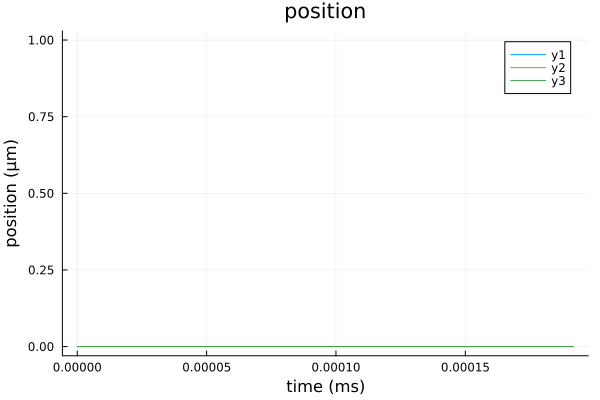

In [610]:
plot()
for i in n_states + length(excited_states) +1 :n_states + length(excited_states) + 3
    plot!(plot_ts/Γ*1e3, [real(u[i]) for u in plot_us]./k*1e6)
end
plot!(legend=true, title="position", xlabel="time (ms)",ylabel="position (μm)")

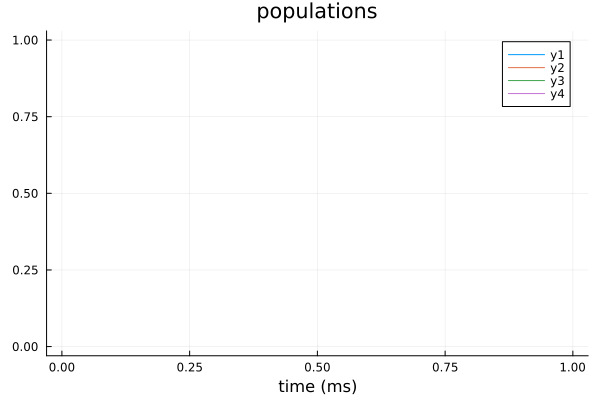

In [410]:
plot_us = p.extra_p.trajectory
plot_ts =(dT*save_every : dT*save_every : length(p.extra_p.trajectory)*dT*save_every);

plot()
for i in 1:n_states
    plot!(plot_ts/Γ*1e3, [norm(plot_us[j][i])^2 for j in eachindex(plot_us)])
end
plot!(legend=true, title="populations", xlabel="time (ms)")

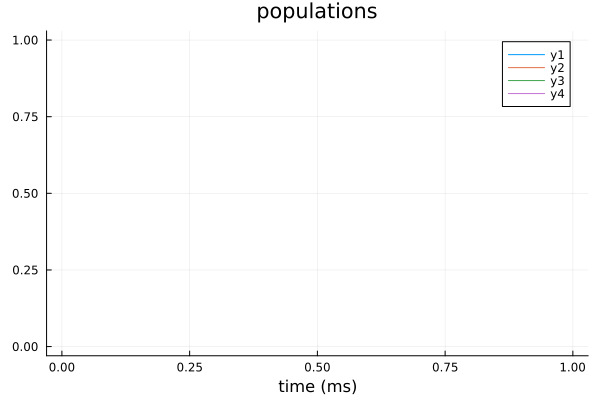

In [505]:
plot_us = p.extra_p.trajectory
plot_ts =(dT*save_every : dT*save_every : length(p.extra_p.trajectory)*dT*save_every);

plot()
for i in 1:n_states
    plot!(plot_ts/Γ*1e3, [norm(plot_us[j][i])^2 for j in eachindex(plot_us)])
end
plot!(legend=true, title="populations", xlabel="time (ms)")

In [506]:
A = StructArray(ones(ComplexF64, 4,4))
Heisenberg!(A, prob.p.eiωt)

In [507]:
A

4×4 StructArray(::Matrix{Float64}, ::Matrix{Float64}) with eltype ComplexF64:
 1.0+0.0im          1.0-0.000432479im  1.0-0.000432479im  1.0-0.000432479im
 1.0+0.000432479im  1.0+0.0im          1.0+0.0im          1.0+0.0im
 1.0+0.000432479im  1.0+0.0im          1.0+0.0im          1.0+0.0im
 1.0+0.000432479im  1.0+0.0im          1.0+0.0im          1.0+0.0im

In [508]:
prob.p.eiωt

4-element StructArray(::Vector{Float64}, ::Vector{Float64}) with eltype ComplexF64:
                1.0 + 0.0im
 0.9999999064808357 - 0.000432479271101248im
 0.9999999064808357 - 0.000432479271101248im
 0.9999999064808357 - 0.000432479271101248im

In [509]:
[norm(plot_us[j][1])^2 for j in eachindex(plot_us)] |> mean |> display
[norm(plot_us[j][2])^2 for j in eachindex(plot_us)] |> mean |> display
[norm(plot_us[j][3])^2 for j in eachindex(plot_us)] |> mean |> display
[norm(plot_us[j][4])^2 for j in eachindex(plot_us)] |> mean |> display

LoadError: MethodError: no method matching zero(::Type{Any})

[0mClosest candidates are:
[0m  zero(::Type{Union{Missing, T}}) where T
[0m[90m   @[39m [90mBase[39m [90m[4mmissing.jl:105[24m[39m
[0m  zero([91m::Union{Type{P}, P}[39m) where P<:Dates.Period
[0m[90m   @[39m [32mDates[39m [90mC:\Users\halla\AppData\Local\Programs\Julia-1.9.2\share\julia\stdlib\v1.9\Dates\src\[39m[90m[4mperiods.jl:51[24m[39m
[0m  zero([91m::ForwardDiff.Dual[39m)
[0m[90m   @[39m [33mForwardDiff[39m [90mC:\Users\halla\.julia\packages\ForwardDiff\vXysl\src\[39m[90m[4mdual.jl:357[24m[39m
[0m  ...


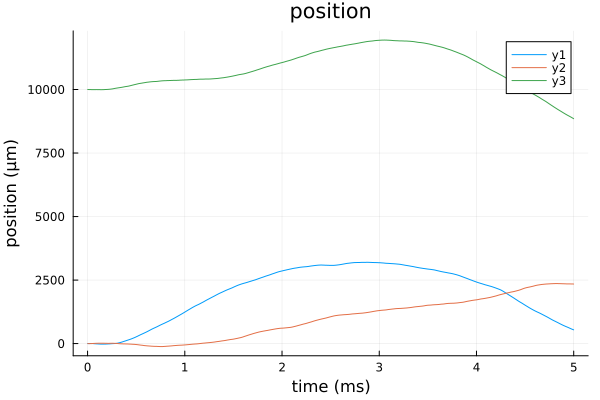

In [500]:
plot()
for i in n_states + length(excited_states) +1 :n_states + length(excited_states) + 3
    plot!(plot_ts/Γ*1e3, [real(u[i]) for u in plot_us]./k*1e6)
end
plot!(legend=true, title="position", xlabel="time (ms)",ylabel="position (μm)")

In [195]:
# vs = [sum(real(u[n_states + length(excited_states) + 6:n_states + length(excited_states) + 8]).^2) for u in sol.u]
# mean(vs[end-length(vs)÷2:end]) * m / (3k_B) .* 1e6

Final temperature = 2.03e-02 K

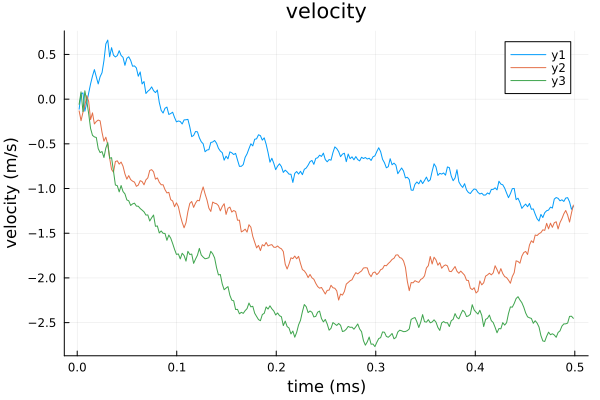

In [563]:
plot()
for i in n_states + length(excited_states) + 4:n_states + length(excited_states) + 6
    plot!(plot_ts/Γ*1e3, [real(u[i]) for u in plot_us]./k*Γ)
end
sol_vz = [real(u[n_states + length(excited_states) + 6]) for u in sol.u].*(Γ/k);
v2 = mean(sol_vz[end-length(sol_vz)÷2:end].^2)
k_B = 1.381e-23
@printf("Final temperature = %.2e K", m*v2/k_B)
plot!(legend=true, title="velocity", xlabel="time (ms)",ylabel="velocity (m/s)")

In [17]:
println("Scattering rate:")
p.n_scatters / (t_span[end] / Γ)

Scattering rate:

2.29958e7

# Propagating multiple particles

In [45]:
function init_isotropic_MOT_distribution(T, diameter)
    kB = 1.381e-23
    m = @with_unit 57 "u"
    σ = sqrt(kB * T / m)
    
    r = Normal(0, diameter)
    v = Normal(0, σ)
    return r, v
end

init_isotropic_MOT_distribution (generic function with 1 method)

In [ ]:
n_values = 100
n_threads=Threads.nthreads()
batch_size = fld(n_values, n_threads)
remainder = n_values - batch_size * n_threads
prog_bar = Progress(n_values)
x_trajectories = Vector{Float64}[]
y_trajectories = Vector{Float64}[]
z_trajectories = Vector{Float64}[]
x_velocities = Vector{Float64}[]
y_velocities = Vector{Float64}[]
z_velocities = Vector{Float64}[]

times = Vector{Float64}[]

particle = OpticalBlochEquations.Particle()
particle.r = (0,0,5e-3).*k
particle.v = (0,0,0*0.2)./(Γ/k)
ψ₀ = zeros(ComplexF64, length(states))
ψ₀[1] = 1.0

dT = 0.1
save_every = 10000
extra_p = MutableNamedTuple(n_excited=length(excited_states), Zeeman_Hz=Zeeman_z_mat, Zeeman_Hx = Zeeman_x_mat, Zeeman_Hy = Zeeman_y_mat,
                            gradient_z=-30e2/k, gradient_x=-30e2/k, gradient_y=30e2/k,dT = dT, save_every = save_every, save_counter = 0, trajectory = Vector{ComplexF64}[])

p = schrodinger_stochastic(particle, states, lasers, d, ψ₀, m/(ħ*k^2/Γ);
    extra_p=extra_p, λ=λ, Γ=Γ, update_H=update_H);

t_span = (0, 10000*Γ*1e-6) #μs
cb = PeriodicCallback(SE_collapse!, dT, save_positions=(false,false))

prob = ODEProblem(ψ_stochastic!, p.ψ, t_span, p);

temp = @with_unit 10 "mK"
diameter = @with_unit 8.0 "mm"
r_dist, v_dist = init_isotropic_MOT_distribution(temp, diameter)

plot(legend=false, title="position", xlabel="time (ms)",ylabel="position (μm)")

Threads.@threads for i ∈ 1:n_threads
    prob_copy = deepcopy(prob)
    cb = PeriodicCallback(SE_collapse_pol!, dT, save_positions=(true, true))
    
    _batch_size = i <= remainder ? (batch_size + 1) : batch_size
    batch_start_idx = 1 + (i <= remainder ? (i - 1) : remainder) + batch_size * (i-1)
    for j ∈ batch_start_idx:(batch_start_idx + _batch_size - 1) 

        randomize_initial_vector!(prob_copy.p,r_dist,v_dist)
        prob_copy = remake(prob_copy, u0=prob_copy.p.ψ)
        prob_copy.p.extra_p.trajectory = Vector{ComplexF64}[]

        sol = DifferentialEquations.solve(prob_copy, alg=DP5(), reltol=1e-3, save_on= false, callback=cb, maxiters=20000000);
        plot_us = prob_copy.p.extra_p.trajectory
        plot_ts =(dT*save_every: dT*save_every : length(prob_copy.p.extra_p.trajectory)*dT*save_every );
        
        push!(x_trajectories, [real(u[n_states + length(excited_states) + 1]) for u in plot_us]./k*1e6)
        push!(y_trajectories, [real(u[n_states + length(excited_states) + 2]) for u in plot_us]./k*1e6)
        push!(z_trajectories, [real(u[n_states + length(excited_states) + 3]) for u in plot_us]./k*1e6)
        push!(x_velocities, [real(u[n_states + length(excited_states) + 4]) for u in plot_us]./k*Γ)
        push!(y_velocities, [real(u[n_states + length(excited_states) + 5]) for u in plot_us]./k*Γ)
        push!(z_velocities, [real(u[n_states + length(excited_states) + 6]) for u in plot_us]./k*Γ)
        push!(times, plot_ts./Γ*1e3)
        next!(prog_bar)
    end
end



Progress:  50%|█████████████████████                    |  ETA: 0:01:40

In [ ]:
plot(legend=false, title="position", xlabel="time (ms)",ylabel="position (μm)")
for j in 1:length(z_trajectories)
   plot!(times[j], z_trajectories[j]) 
end
plot!()

In [ ]:
plot(legend=false, title="position", xlabel="time (ms)",ylabel="position (μm)")
for j in 1:length(x_trajectories)
   plot!(times[j], x_trajectories[j]) 
end
plot!()

In [ ]:
plot(legend=false, title="position", xlabel="time (ms)",ylabel="position (μm)")
for j in 1:length(x_trajectories)
   plot!(times[j], y_trajectories[j]) 
end
plot!()

In [ ]:
plot(legend=false, title="velocity", xlabel="time (ms)",ylabel="velocity (m/s)")
for j in 1:length(x_trajectories)
   plot!(times[j], z_velocities[j])
end
plot!()

In [ ]:
plot(legend=false, title="velocity", xlabel="time (ms)",ylabel="temperature (μK)")
σ_v = []
for i in 1:1000
   push!(σ_v, std([v[i] for v in x_velocities]))
end
plot!(times[1][1:1000], m*σ_v.^2/k_B*1e6)

In [98]:
equilibrium_velocities = zeros(Float64,0)
for v_particle in x_velocities
   equilibrium_velocities = [equilibrium_velocities; v_particle[end - length(times[1])÷2: end]] 
end

v2 = std(equilibrium_velocities)^2

k_B = 1.381e-23
@printf("Final temperature = %.2e K", m*v2/k_B)
;

Final temperature = 1.30e-02 K

Final temperature = 5.55e-06 K

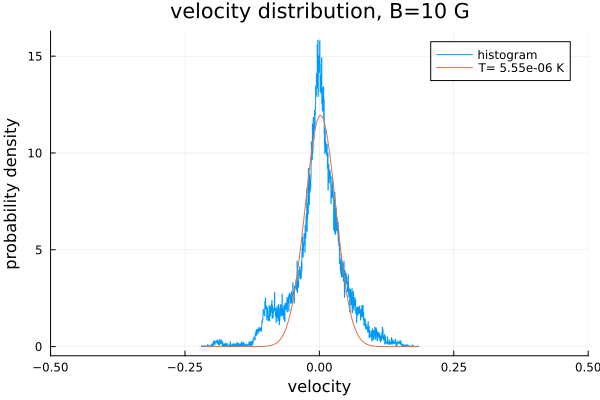

In [77]:
plot(legend=true, xlabel="velocity", ylabel="probability density", title="velocity distribution, B=10 G")
v2 = std(equilibrium_velocities)^2


x = stephist!(equilibrium_velocities, normalize=:pdf, label="histogram", nbins=1000)

hist_data = fit(Histogram, equilibrium_velocities, nbins=1000)
hist_data.isdensity = true
v = collect(hist_data.edges[1])
dv = v[2]-v[1]
v = v[1:end-1] .+ dv/2
fv = hist_data.weights ./ (sum(hist_data.weights) * dv)

v_fit = curve_fit(Gaussian, v, fv, [0.01, 0, 50])
σ, x0, A = v_fit.param

k_B = 1.381e-23
fit_T = m*σ^2/k_B
@printf("Final temperature = %.2e K", fit_T)

plot!(v, Gaussian(v, v_fit.param), label=@sprintf("T= %.2e K", fit_T))
plot!(xlim=(-0.5,0.5))

Final temperature = 5.55e-06 K

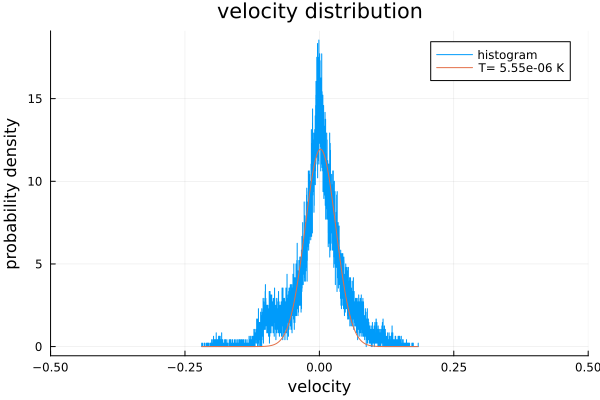

In [73]:
plot(legend=true, xlabel="velocity", ylabel="probability density", title="velocity distribution")
v2 = std(equilibrium_velocities)^2


x = stephist!(equilibrium_velocities, normalize=:pdf, label="histogram", nbins=4000)

hist_data = fit(Histogram, equilibrium_velocities, nbins=4000)
hist_data.isdensity = true
v = collect(hist_data.edges[1])
dv = v[2]-v[1]
v = v[1:end-1] .+ dv/2
fv = hist_data.weights ./ (sum(hist_data.weights) * dv)

v_fit = curve_fit(Gaussian, v, fv, [0.01, 0, 50])
σ, x0, A = v_fit.param

k_B = 1.381e-23
fit_T = m*σ^2/k_B
@printf("Final temperature = %.2e K", fit_T)

plot!(v, Gaussian(v, v_fit.param), label=@sprintf("T= %.2e K", fit_T))
plot!(xlim=(-0.5,0.5))

Final temperature = 5.35e-07 K

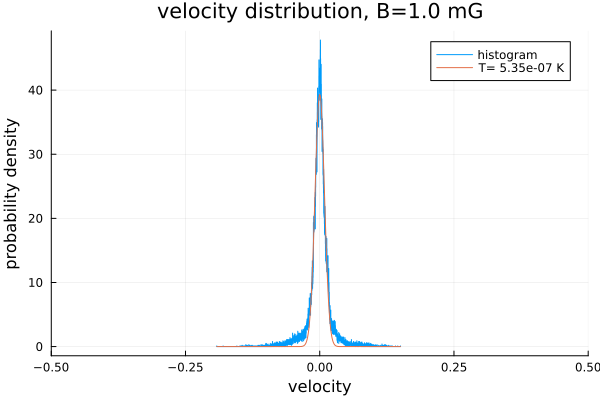

In [1110]:
plot(legend=true, xlabel="velocity", ylabel="probability density", title="velocity distribution, B=1.0 mG", xlim=[-1,1])
v2 = std(equilibrium_velocities)^2


x = stephist!(equilibrium_velocities, normalize=:pdf, label="histogram", nbins=4000)

hist_data = fit(Histogram, equilibrium_velocities, nbins=4000)
hist_data.isdensity = true
v = collect(hist_data.edges[1])
dv = v[2]-v[1]
v = v[1:end-1] .+ dv/2
fv = hist_data.weights ./ (sum(hist_data.weights) * dv)

v_fit = curve_fit(Gaussian, v, fv, [0.01, 0, 50])
σ, x0, A = v_fit.param

k_B = 1.381e-23
fit_T = m*σ^2/k_B
@printf("Final temperature = %.2e K", fit_T)

plot!(v, Gaussian(v, v_fit.param), label=@sprintf("T= %.2e K", fit_T))
plot!(xlim=(-0.5,0.5))

Final temperature = 5.35e-07 K

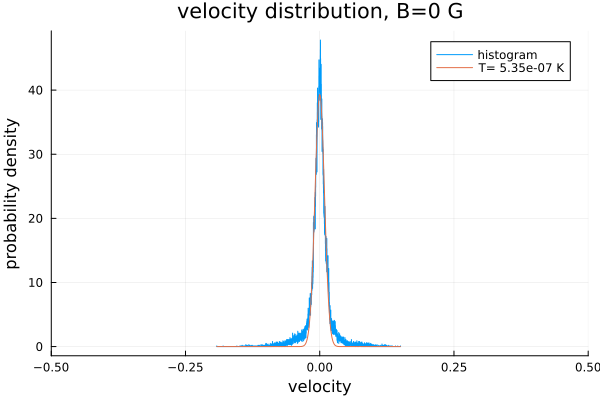

In [1111]:
plot(legend=true, xlabel="velocity", ylabel="probability density", title="velocity distribution, B=0 G")
v2 = std(equilibrium_velocities)^2


x = stephist!(equilibrium_velocities, normalize=:pdf, label="histogram", nbins=4000)

hist_data = fit(Histogram, equilibrium_velocities, nbins=4000)
hist_data.isdensity = true
v = collect(hist_data.edges[1])
dv = v[2]-v[1]
v = v[1:end-1] .+ dv/2
fv = hist_data.weights ./ (sum(hist_data.weights) * dv)

v_fit = curve_fit(Gaussian, v, fv, [0.01, 0, 50])
σ, x0, A = v_fit.param

k_B = 1.381e-23
fit_T = m*σ^2/k_B
@printf("Final temperature = %.2e K", fit_T)

plot!(v, Gaussian(v, v_fit.param), label=@sprintf("T= %.2e K", fit_T))
plot!(xlim=(-0.5,0.5))

Final temperature = 2.79e-05 K

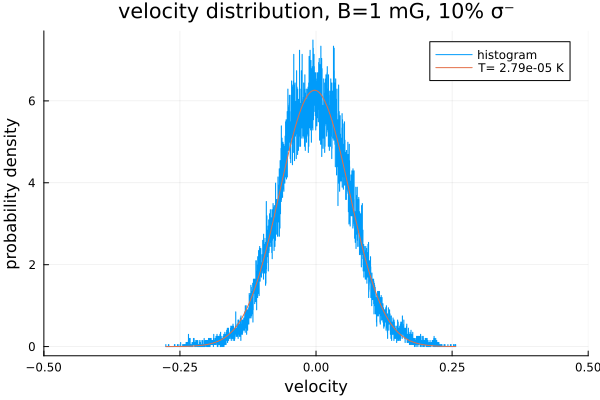

In [1034]:
plot(legend=true, xlabel="velocity", ylabel="probability density", title="velocity distribution, B=1 mG, 10% σ⁻")
v2 = std(equilibrium_velocities)^2


x = stephist!(equilibrium_velocities, normalize=:pdf, label="histogram", nbins=4000)

hist_data = fit(Histogram, equilibrium_velocities, nbins=4000)
hist_data.isdensity = true
v = collect(hist_data.edges[1])
dv = v[2]-v[1]
v = v[1:end-1] .+ dv/2
fv = hist_data.weights ./ (sum(hist_data.weights) * dv)

v_fit = curve_fit(Gaussian, v, fv, [0.01, 0, 50])
σ, x0, A = v_fit.param

k_B = 1.381e-23
fit_T = m*σ^2/k_B
@printf("Final temperature = %.2e K", fit_T)

plot!(v, Gaussian(v, v_fit.param), label=@sprintf("T= %.2e K", fit_T))
plot!(xlim=(-0.5,0.5))

Final temperature = 3.36e-07 K

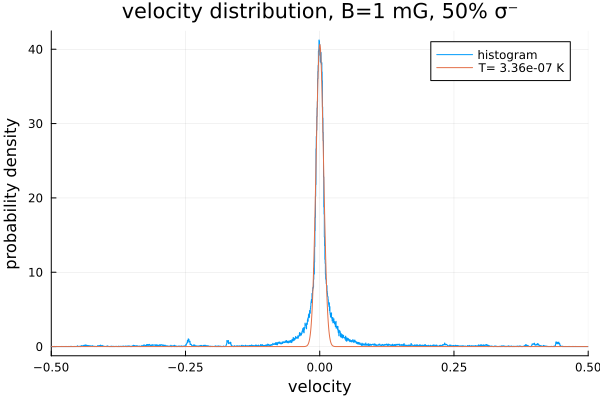

In [609]:
plot(legend=true, xlabel="velocity", ylabel="probability density", title="velocity distribution, B=1 mG, 50% σ⁻")
v2 = std(equilibrium_velocities)^2


x = stephist!(equilibrium_velocities, normalize=:pdf, label="histogram", nbins=4000)

hist_data = fit(Histogram, equilibrium_velocities, nbins=4000)
hist_data.isdensity = true
v = collect(hist_data.edges[1])
dv = v[2]-v[1]
v = v[1:end-1] .+ dv/2
fv = hist_data.weights ./ (sum(hist_data.weights) * dv)

v_fit = curve_fit(Gaussian, v, fv, [0.01, 0, 50])
σ, x0, A = v_fit.param

k_B = 1.381e-23
fit_T = m*σ^2/k_B
@printf("Final temperature = %.2e K", fit_T)

plot!(v, Gaussian(v, v_fit.param), label=@sprintf("T= %.2e K", fit_T))
plot!(xlim=(-0.5,0.5))

# Comparison to Monte Carlo simulations with OBE

  4.025756 seconds (6.19 M allocations: 718.537 MiB, 1.67% gc time, 85.57% compilation time)


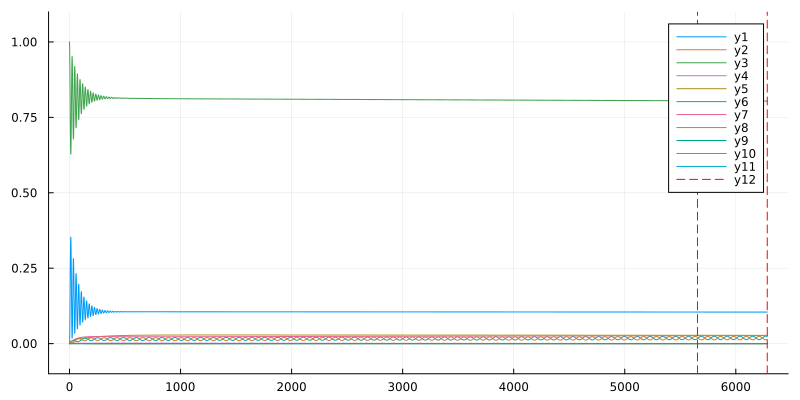

In [172]:
particle = Particle()
ρ0 = zeros(ComplexF64, length(H.states), length(H.states))
ρ0[3,3] = 1.0
freq_res = 1e-2

p = obe(ρ0, particle, H.states, lasers, d, d, true, true, λ, Γ, freq_res, nothing)

t_end = 10p.period
tspan = (0., t_end)
prob = ODEProblem(ρ!, p.ρ0_vec, tspan, p)
callback = PeriodicCallback(reset_force!, prob.p.period)

prob.p.r0 = (0., 0., 0.4) .* 2π
prob.p.v = (0., 0., 0.0)
@time sol = DifferentialEquations.solve(prob, alg=DP5(), reltol=1e-5, abstol = 1e-5, callback=callback)
prob.p.force_last_period .* (ħ * k * Γ / m)*1e-3

using Plots
plot_us = sol.u#[1:10:end]
plot_ts = sol.t#[1:10:end]

n_states = size(p.ρ_soa, 1)
plot(size=(800, 400), ylim=(-0.1, 1.1), legend=nothing)
for i in 1:n_states
    state_idx = n_states*(i-1) + i
    plot!(plot_ts, [real(u[state_idx]) for u in plot_us])
end
plot!(legend=true)
offset = 0
vline!([sol.t[end] - prob.p.period - offset, sol.t[end] - offset], color="red", linestyle=:dash)

In [29]:


function prob_func!(prob, scan_params, i)
    p = prob.p
    
    # Update velocity and position
    p.particle.v .= scan_params[i].v
    p.particle.r0 .= scan_params[i].r
    
    
    # Update magnetic field
    H = p.extra_p.H
    H.parameters.B_z = scan_params[i].B
    evaluate!(H)
    QuantumStates.solve!(H)
    
    # Update transition dipole moments
    update_basis_tdms!(H)
    update_tdms!(H)
    new_d = H.tdms
    
    s = p.extra_p.s
    ω1 = p.extra_p.ω1
    
    k̂ = +x̂; ϵ1 = exp(im*scan_params[i].θx) *rotate_pol(σ⁺, k̂); ϵ_func1 = ϵ_(ϵ1); laser1 = Field(k̂, ϵ_func1, ω1, s)
    k̂ = -x̂; ϵ2 = exp(im*scan_params[i].θx) *rotate_pol(σ⁺, k̂); ϵ_func2 = ϵ_(ϵ2); laser2 = Field(k̂, ϵ_func2, ω1, s)

    k̂ = +ŷ; ϵ3 = exp(im*scan_params[i].θy) * rotate_pol(σ⁺, k̂); ϵ_func3 = ϵ_(ϵ3); laser3 = Field(k̂, ϵ_func3, ω1, s)
    k̂ = -ŷ; ϵ4 = exp(im*scan_params[i].θy) *rotate_pol(σ⁺, k̂); ϵ_func4 = ϵ_(ϵ4); laser4 = Field(k̂, ϵ_func4, ω1, s)

    k̂ = +ẑ; ϵ5 = rotate_pol(σ⁺, k̂);  ϵ_func5 = ϵ_(ϵ5); laser5 = Field(k̂, ϵ_func5, ω1, s)
    k̂ = -ẑ; ϵ6 = rotate_pol(σ⁺, k̂);  ϵ_func6 = ϵ_(ϵ6); laser6 = Field(k̂, ϵ_func6, ω1, s)

    lasers = [laser1, laser2, laser3, laser4, laser5, laser6]
    new_p = obe(p.ρ0, p.particle, H.states, lasers, new_d, nothing, true, true, p.λ, p.Γ, p.freq_res, p.extra_p)
    
    
    return remake(prob, p=new_p)
end

function output_func(p, sol)
    f = p.force_last_period
    return f
end
;

In [584]:
ρ0 = zeros(ComplexF64, length(H.states), length(H.states))
ρ0[3,3] = 1.0

t_end = 10p.period
tspan = (0., t_end)

using RectiGrids

freq_res = 1e-2
extra_p = (H=H, lasers=lasers, ω1 = ω1, s = s)
p = obe(ρ0, particle, H.states, lasers, d, d, true, true, λ, Γ, freq_res, extra_p)

t_end = 10p.period+1; tspan = (0., t_end)
prob = ODEProblem(ρ!, p.ρ0_vec, tspan, p, reltol=1e-3, save_on=false)

di = 5
rs = vcat([(n1*λ/(di+1), n2*λ/(di+1), n3*λ/(di+1)) .* 2π for n1 ∈ 0:di, n2 ∈ 0:di, n3 ∈ 0:di]...)
vzs = LinRange(0,15/(Γ/k),100)
vs = []
for vz in vzs
    push!(vs, [0,0,vz])
end

# vs = [sample_direction(0.0) for _ in 1:1]


scan_values = (B = [0.0], r = rs, v = vs, θx = [0.0], θy = [0.0])
scan_values_grid = RectiGrids.grid(scan_values)

@time forces, populations = force_scan_v2(prob, scan_values_grid, prob_func!, output_func);

averaged_forces = []
averaged_A_populations = []
@time for (i,vz) ∈ enumerate(vzs)
    idxs = [j for (j,x) ∈ enumerate(scan_values_grid) if x.v[3] == vz]
    push!(averaged_forces, mean([f[3] for f in forces[idxs]]))
    push!(averaged_A_populations, mean(populations[idxs, 4:6])*3)
end

LoadError: UndefVarError: `H` not defined

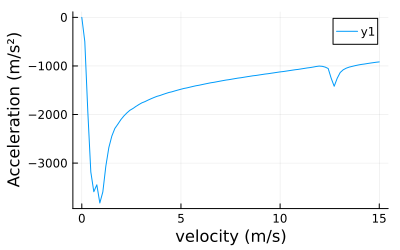

In [175]:
plot(xlabel="velocity (m/s)", ylabel="Acceleration (m/s²)",size=(400,250))
plot!(vzs.*(Γ/k), averaged_forces.* (ħ * k * Γ / m))

In [176]:
# plot(vzs.*(Γ/k), averaged_A_populations,size=(400,250))

In [177]:
include("G:\\My Drive\\github\\BlueDetunedMOTSimulations\\CaOH_simulation_toolbox.jl");
using Interpolations, BeamPropagation
;

In [178]:
scan_values = Dict{String, Vector{Float64}}("B"=>[-1000,1000], "v"=>vzs)
acceleration = zeros(2,length(averaged_forces))
A_populations = zeros(2,length(averaged_forces))

acceleration[1,:] = acceleration[2,:] = averaged_forces.*(ħ * k * Γ / m)
A_populations[1,:] = A_populations[2,:] = averaged_A_populations

acceleration_grids = make_grids(scan_values, acceleration)
A_population_grids = make_grids(scan_values, A_populations)



# Interpolate (in SI units)
B_range = range(scan_values["B"][1],scan_values["B"][end], length=length(scan_values["B"]))
v_range = range(scan_values["v"][1]* (Γ / k),scan_values["v"][end]* (Γ / k), length=length(scan_values["v"]))
        

nodes = (scan_values["B"], scan_values["v"].* (Γ / k))
acceleration_func = interpolate(nodes, acceleration_grids, Gridded(Linear()))
A_population_func = interpolate(nodes, A_population_grids, Gridded(Linear()))     
A_population_func = extrapolate(A_population_func, Flat());


["B", "v"]
["B", "v"]


In [179]:
# y = scan_values["v"].* (Γ / k)
# B_fixed = 1
# plot(xlabel="velocity (m/s)", ylabel="Acceleration (m/s²)",size=(400,250))
# plot!(y, acceleration_func(-100,y) , label=@sprintf("B = %.1f G", B_fixed) )
# plot!()

In [109]:
function update(particles, p, s, dt, time, idx)
    hbar = 1.05457182e-34 
    for i in 1:size(particles, 1)
        B = particles.r[i][3] * p.B_gradient
        v = particles.v[i]
        Pe = p.A_population_func(B * sign(v[3]), abs(v[3]))
        scattering_prob = dt * Γ * Pe
        if rand() < scattering_prob 
            v_rand = sample_direction(hbar * k / m) * 1
            particles.v[i] += SVector(0,0,v_rand[3])
            # if rand() < 0.5
            #     particles.v[i] += sample_direction(hbar * k / m) # SVector(0,0,hbar * k / m)
            # else
            #     particles.v[i] -= SVector(0,0,hbar * k / m)
            # end
        end
    end
    return nothing
end

function init_1D_MOT_distribution(T, diameter)
    kB = 1.381e-23
    m = @with_unit 57 "u"
    σ = sqrt(kB * T / m)
    
    r = (Normal(0, diameter), Normal(0, diameter), Normal(0, diameter))
    v = (Normal(0, σ), Normal(0, σ), Normal(0, σ))
    a = (Normal(0, 0), Normal(0, 0), Normal(0, 0))
    return r, v, a
end

function init_isotropic_MOT_distribution(T, diameter)
    kB = 1.381e-23
    m = @with_unit 57 "u"
    σ = sqrt(kB * T / m)
    
    r = Normal(0, diameter)
    v = Normal(0, σ)
    return r, v
end


function discard_particles!(particles, discard)
    @inbounds for i in 1:size(particles, 1)
        particles.dead[i] = discard(particles.r[i], particles.v[i])
    end
    StructArrays.foreachfield(x -> deleteat!(x, particles.dead), particles)
    return nothing
end

function discard_out_of_bound(r, v)
    if abs(r[3]) > abs( maximum(scan_values["B"]) / B_gradient )
        return true
    elseif abs(v[3]) > abs( maximum(scan_values["v"])* (Γ / k))
        return true
    else
        return false
    end
end

discard_out_of_bound (generic function with 1 method)

In [181]:
import BeamPropagation.Particle
import StructArrays: StructArray, StructVector
using StructArrays

B_gradient = 0
n = 1000
save_every = 3000
delete_every = 100
dt_min = 1e-10
dt_max = 1e-4
abstol = 1e-5
dt = 1e-8
total_time = @with_unit 5 "ms"
max_steps = Int64(ceil(total_time / dt))
alg = "rkf12"
use_adaptive = false
dt0 = 1e-5
times = (0:dt:max_steps * dt)[1:save_every:end-1]


particles = StructArray{BeamPropagation.Particle}(undef, n)
trajectories = [SVector{3, Float64}[] for _ ∈ 1:length(particles)]
velocities = [SVector{3, Float64}[] for _ ∈ 1:length(particles)]
A_populations = [SVector{1, Float64}[] for _ ∈ 1:length(particles)]

temp = @with_unit 1 "mK"
diameter = @with_unit 0.6 "mm"
r, v, a = init_1D_MOT_distribution(temp, diameter)



p = MutableNamedTuple(B_gradient=B_gradient, acceleration_func=acceleration_func, A_population_func = A_population_func)
mc_s = MutableNamedTuple(trajectories=trajectories, velocities = velocities, A_populations = A_populations)

@time propagate_particles!(r, v, a, 
    alg, particles, f, save, discard_out_of_bound, save_every, delete_every, max_steps, update, p, mc_s, dt, use_adaptive, 
    dt_min, dt_max, abstol, true
)



Progress: 100%|█████████████████████████████████████████| Time: 0:00:0439mProgress:   0%|█                                        |  ETA: 30.02 days


  4.219141 seconds (42.01 M allocations: 726.699 MiB, 367.81% compilation time)


Final temperature = 9.05e-05 K

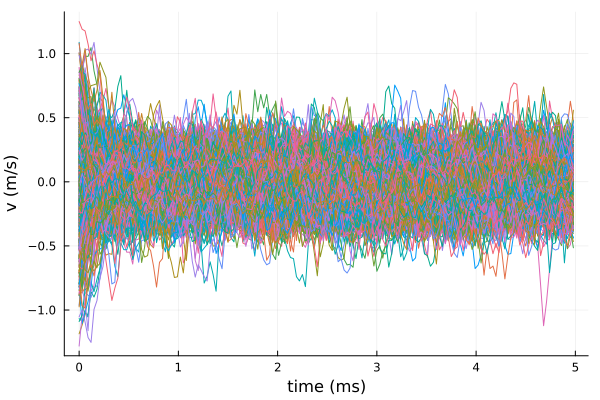

In [182]:
plot(xlabel="time (ms)", ylabel="v (m/s)", legend=false)
for particle_id in 1:1:n
    particle_z_velocity = [mc_s.velocities[particle_id][i][3] for i in  eachindex(mc_s.trajectories[particle_id])]
    plot!(times[1:length(particle_z_velocity)] * 1e3, particle_z_velocity)
end

vs = []
i_half = length(times)÷2
for particle_id in 1:1:n
    push!(vs, mc_s.velocities[particle_id][i_half][3])
end
v = std(vs)

k_B = 1.381e-23
@printf("Final temperature = %.2e K", 1/2*m*v^2/k_B)


plot!()

In [60]:
function add_B_to_A!(A::StructArray{<:Complex}, B::StructArray{<:Complex})
    @turbo for i ∈ eachindex(A)
        A.re[i] = A.re[i] + B.re[i]
        A.im[i] = A.im[i] + B.im[i]
    end
end

function add_B_to_A_with_scalar!(A::StructArray{<:Complex}, B::StructArray{<:Complex}, scalar::Float64)
    @turbo for i ∈ eachindex(A)
        A.re[i] = A.re[i] + scalar * B.re[i]
        A.im[i] = A.im[i] + scalar * B.im[i]
    end
end

add_B_to_A_with_scalar! (generic function with 1 method)

### Copies of some private functions from OpticalBlochEquations package

In [18]:
# Multiplication using `@turbo` from LoopVectorization
function mul_turbo!(C, A, B)
    @turbo for m ∈ 1:size(A,1), n ∈ 1:size(B,2)
        Cmn_re = 0.0
        Cmn_im = 0.0
        for k ∈ 1:size(A,2)
            A_mk_re = A.re[m,k]
            A_mk_im = A.im[m,k]
            B_kn_re = B.re[k,n]
            B_kn_im = B.im[k,n]
            Cmn_re += A_mk_re * B_kn_re - A_mk_im * B_kn_im
            Cmn_im += A_mk_re * B_kn_im + A_mk_im * B_kn_re
        end
        C.re[m,n] = Cmn_re
        C.im[m,n] = Cmn_im
    end
end

function mul_by_im!(C::StructArray{<:Complex})
    @turbo for i ∈ eachindex(C)
        a = C.re[i]
        C.re[i] = -C.im[i]
        C.im[i] = a
    end
end

function mul_by_im_minus!(C::StructArray{<:Complex})
    @turbo for i ∈ eachindex(C)
        a = C.re[i]
        C.re[i] = C.im[i]
        C.im[i] = -a
    end
end

function soa_to_base!(ρ::Array{<:Complex}, ρ_soa::StructArray{<:Complex})
    @inbounds for i in eachindex(ρ_soa)
        ρ[i] = ρ_soa.re[i] + im * ρ_soa.im[i]
    end
    return nothing
end

function base_to_soa!(ρ::Array{<:Complex}, ρ_soa::StructArray{<:Complex})
    @inbounds for i in eachindex(ρ_soa)
        ρ_soa.re[i] = real(ρ[i])
        ρ_soa.im[i] = imag(ρ[i])
    end
    return nothing
end

function base_to_soa_vec!(ρ::Array{<:Complex}, ρ_soa::StructArray{<:Complex})
    @inbounds for i in eachindex(ρ, ρ_soa)
        ρ_soa.re[i] = real(ρ[i])
        ρ_soa.im[i] = imag(ρ[i])
    end
    return nothing
end

function update_eiωt!(eiωt::StructArray{<:Complex}, ω::Array{<:Real}, τ::Real)
    @turbo for i ∈ eachindex(ω)
        eiωt.im[i], eiωt.re[i] = sincos( ω[i] * τ )
    end
    return nothing
end



update_eiωt! (generic function with 1 method)

In [25]:
import OpticalBlochEquations.update_H!

function update_H(H, p, τ)
    @turbo for i in eachindex(H)
        H.re[i] = p.H₀.re[i]
        H.im[i] = p.H₀.im[i]
    end
    return nothing
end

function update_H!(p, τ, r, H₀, fields, H, E_k, ds, ds_state1, ds_state2, Js)

    p.update_H(H, p, τ)
    
    # @turbo for i in eachindex(H)
    #     H.re[i] = H₀.re[i]
    #     H.im[i] = H₀.im[i]
    # end
 
    update_fields!(fields, r, τ)

    # Set summed fields to zero
    p.E -= p.E
    @inbounds for i ∈ 1:3
        E_k[i] -= E_k[i]
    end
    
    # Sum updated fields
    @inbounds for i ∈ eachindex(fields)
        E_i = fields.E[i] * sqrt(fields.s[i]) / (2 * √2)
        k_i = fields.k[i]
        p.E += E_i
        for k ∈ 1:3
            E_k[k] += E_i * k_i[k]
        end
    end

    # This can be used to exclude very off-resonant terms, need to add a user-defined setting to determine behavior
    # @inbounds for i ∈ eachindex(fields)
    #     s = fields.s[i]
    #     ω_field = fields.ω[i]
    #     x = sqrt(s) / (2 * √2)
    #     @inbounds for q ∈ 1:3
    #         E_i_q = fields.E[i][q]
    #         if norm(E_i_q) > 1e-10
    #             d_nnz_q = d_nnz[q]
    #             d_q = @view d[:,:,q]
    #             @inbounds @simd for cart_idx ∈ d_nnz_q
    #                 m, n = cart_idx.I
    #                 if abs(ω_field - (ω[n] - ω[m])) < 100 # Do not include very off-resonant terms (terms detuned by >10Γ)
    #                     val = x * E_i_q * d_q[m,n]
    #                     H[m,n] += val
    #                     H[n,m] += conj(val)
    #                 end
    #             end
    #         end
    #     end
    # end

    @inbounds for q ∈ 1:3
        E_q = p.E[q]
        if norm(E_q) > 1e-10
            E_q_re = real(E_q)
            E_q_im = imag(E_q)
            ds_q = ds[q]
            ds_q_re = ds_q.re
            ds_q_im = ds_q.im
            ds_state1_q = ds_state1[q]
            ds_state2_q = ds_state2[q]
            @turbo for i ∈ eachindex(ds_q)
                m = ds_state1_q[i] # excited state
                n = ds_state2_q[i] # ground state
                d_re = ds_q_re[i]
                d_im = ds_q_im[i]
                val_re = E_q_re * d_re - E_q_im * d_im
                val_im = E_q_re * d_im + E_q_im * d_re
                H.re[n,m] += val_re
                H.im[n,m] += val_im
                H.re[m,n] += val_re
                H.im[m,n] -= val_im
            end
        end
    end

    # Is this version faster?
    # @inbounds for q ∈ 1:3
    #     E_q = p.E[q]
    #     if norm(E_q) > 1e-10
    #         d_nnz_q = d_nnz[q]
    #         d_q = @view d[:,:,q]
    #         @inbounds @simd for cart_idx ∈ d_nnz_q
    #             m, n = cart_idx.I
    #             val = E_q * d_q[m,n]
    #             H[m,n] += val
    #             H[n,m] += conj(val)
    #         end
    #     end
    # end

    for J ∈ Js
        rate = im * J.r^2 / 2
        H[J.s, J.s] -= rate
    end

    return nothing
end

round_to_mult(val, prec) = round.(val ./ prec) .* prec

function round_freq(ω, freq_res)
    ω_min = freq_res
    return round_to_mult(ω, ω_min)
end
export round_freq



function round_v_by_norm(v, digits)
    v_norm = norm(v)
    return v ./ (v_norm / round(v_norm, digits=digits))
end

function round_freqs!(states, fields, freq_res)
    """
    Rounds frequencies of state energies and fields by a common denominator.
    
    freq_res::Float: all frequencies are rounded by this value (in units of Γ)
    """
    for i in eachindex(fields)
        fields.ω[i] = round_freq(fields.ω[i], freq_res)
    end
    for i in eachindex(states)
        states.E[i] = round_freq(states.E[i], freq_res)
    end
    return nothing
end


round_freqs! (generic function with 1 method)

In [202]:
F = 1
F′ = 1
J_mat = zeros(2F+1 + 2F′+1,2F+1 + 2F′+1)
for i in 1:2F+1
    M = -F-1+i
    for j in 2F+2:2F+1+2F′+ 1
        M′ = -F′-1+ (j - 2F - 1)
        for p in -1:1:1
            J_mat[i,j] += norm(wigner3j(F, 1, F′, M, -p, -M′))^2
        end
    end
end
J_mat

6×6 Matrix{Float64}:
 0.0  0.0  0.0  0.166667  0.166667  0.0
 0.0  0.0  0.0  0.166667  0.0       0.166667
 0.0  0.0  0.0  0.0       0.166667  0.166667
 0.0  0.0  0.0  0.0       0.0       0.0
 0.0  0.0  0.0  0.0       0.0       0.0
 0.0  0.0  0.0  0.0       0.0       0.0

In [207]:
Ux = [[1/2, -1/sqrt(2), 1/2],
    [-1/sqrt(2),0,1/sqrt(2)],
    [1/2, 1/sqrt(2), 1/2]]

Ux = mapreduce(permutedims, vcat, Ux)

U = zeros(2F+1 + 2F′+1,2F+1 + 2F′+1)

3×3 Matrix{Float64}:
  0.5       -0.707107  0.5
 -0.707107   0.0       0.707107
  0.5        0.707107  0.5